In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.layers import Dropout
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import json

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# define the base path to the input dataset and then use it to derive
# the path to the images directory and annotation CSV file
BASE_PATH = "/content/drive/MyDrive"
IMAGES_PATH = os.path.sep.join([BASE_PATH, "pca_products_real"])
ANNOTS_PATH = os.path.sep.join([BASE_PATH, "annotations.json"])

# define the path to the base output directory
BASE_OUTPUT = "/content/outputt"
# define the path to the output serialized model, model training plot,
# and testing image filenames
MODEL_PATH = os.path.sep.join([BASE_OUTPUT, "detector.h5"])
PLOT_PATH = os.path.sep.join([BASE_OUTPUT, "plot.png"])
TEST_FILENAMES = os.path.sep.join([BASE_OUTPUT, "test_images.txt"])

# initialize our initial learning rate, number of epochs to train
# for, and the batch size
INIT_LR = 4e-4
NUM_EPOCHS = 30
BATCH_SIZE = 16


In [ ]:

# load the contents of the CSV annotations file
print("[INFO] loading dataset...")
json_data = json.load(open(ANNOTS_PATH))
# initialize the list of data (images), our target output predictions
# (bounding box coordinates), along with the filenames of the
# individual images
data = []
targets = []
filenames = []


[INFO] loading dataset...


In [ ]:


'''
Multiple annotations are present in the diff row
'''
for key, value in list(json_data.items()):
  filename = key
  bboxes = []
  imagePath = os.path.sep.join([IMAGES_PATH, filename])
  if not os.path.exists(imagePath):
    break
  # print(imagePath)
  image = cv2.imread(imagePath)
  (h, w) = image.shape[:2]
  # image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  image = cv2.resize(image,(224, 224))
  # image = cv2.erode(image, None, iterations=1)
  image = img_to_array(image)
  for ann in value['ann']:
    if ann['cls'] == 'date':
      startX, startY, endX, endY = ann['bbox']
      startX = float(startX) / w
      startY = float(startY) / h
      endX = float(endX) / w
      endY = float(endY) / h
      print(startX, startY, endX, endY)
      bboxes.append([startX, startY, endX, endY])
      data.append(image)
      targets.append((startX, startY, endX, endY))
      filenames.append(filename)

0.38227513227513227 0.6547619047619048 0.5529100529100529 0.6676587301587301
0.4120667522464698 0.5971093044263776 0.675224646983312 0.6097560975609756
0.30095036958817317 0.6072842438638163 0.5480464625131996 0.620744259699129
0.29989440337909185 0.5914489311163895 0.5522703273495249 0.6057007125890737
0.4924039320822163 0.4684147794994041 0.677390527256479 0.48748510131108463
0.5653266331658291 0.4626865671641791 0.6947236180904522 0.48258706467661694
0.42843232716650437 0.512987012987013 0.572541382667965 0.5298701298701298
0.4294060370009737 0.5311688311688312 0.5666991236611489 0.5467532467532468
0.3445867287543655 0.662882096069869 0.4691501746216531 0.6768558951965066
0.20512820512820512 0.33508541392904073 0.33530571992110453 0.35742444152431013
0.4165424739195231 0.6272365805168986 0.6177347242921013 0.6461232604373758
0.589041095890411 0.655862726406101 0.7728310502283106 0.6701620591039085
0.5878995433789954 0.6711153479504289 0.769406392694064 0.684461391801716
0.4831349206

In [ ]:
data = np.array(data, dtype="float32") / 255.0
targets = np.array(targets, dtype="float32")
# partition the data into training and testing splits using 90% of
# the data for training and the remaining 10% for testing
split = train_test_split(data, targets, filenames, test_size=0.10,
	random_state=42)
# unpack the data split
(trainImages, testImages) = split[:2]
(trainTargets, testTargets) = split[2:4]
(trainFilenames, testFilenames) = split[4:]
# write the testing filenames to disk so that we can use then
# when evaluating/testing our bounding box regressor
print("[INFO] saving testing filenames...")
f = open(TEST_FILENAMES, "w")
f.write("\n".join(testFilenames))
f.close()

[INFO] saving testing filenames...


In [ ]:

# load the VGG16 network, ensuring the head FC layers are left off
vgg = VGG16(weights="imagenet", include_top=False,
	input_tensor=Input(shape=(224, 224, 3)))
# freeze all VGG layers so they will *not* be updated during the
# training process
vgg.trainable = False
# flatten the max-pooling output of VGG
flatten = vgg.output
flatten = Flatten()(flatten)
# construct a fully-connected layer header to output the predicted
# bounding box coordinates
bboxHead = Dense(256, activation="relu")(flatten)
# bboxHead = Dropout(0.5)(bboxHead)
# //bboxHead = Dense(256, activation="relu")(bboxHead)
# bboxHead = Dropout(0.5)(bboxHead)
bboxHead = Dense(128, activation="relu")(bboxHead)
# bboxHead = Dropout(0.5)(bboxHead)
bboxHead = Dense(64, activation="relu")(bboxHead)
# bboxHead = Dropout(0.5)(bboxHead)
bboxHead = Dense(32, activation="relu")(bboxHead)
# bboxHead = Dropout(0.5)(bboxHead)
bboxHead = Dense(4, activation="sigmoid")(bboxHead)
# construct the model we will fine-tune for bounding box regression
model = Model(inputs=vgg.input, outputs=bboxHead)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
# initialize the optimizer with the correct parameter name
opt = Adam(learning_rate=INIT_LR)
model.compile(
    loss="mse",
    optimizer=opt,
    metrics=[
        'MeanSquaredError',
        'accuracy',
    ]
)
print(model.summary())

# train the network for bounding box regression
print("[INFO] training bounding box regressor...")
H = model.fit(
    trainImages, trainTargets,
    validation_data=(testImages, testTargets),
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    verbose=1
)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 21,180,836 (80.80 MB)

 Trainable params: 6,466,148 (24.67 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

None
[INFO] training bounding box regressor...
Epoch 1/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 27s 8s/step - MeanSquaredError: 0.0292 - accuracy: 0.1378 - loss: 0.0292 - val_MeanSquaredError: 0.0416 - val_accuracy: 1.0000 - val_loss: 0.0416
Epoch 2/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 41s 7s/step - MeanSquaredError: 0.0234 - accuracy: 0.5769 - loss: 0.0234 - val_MeanSquaredError: 0.0189 - val_accuracy: 0.5000 - val_loss: 0.0189
Epoch 3/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 44s 8s/step - MeanSquaredError: 0.0132 - accuracy: 0.2687 - loss: 0.0132 - val_MeanSquaredError: 0.0224 - val_accuracy: 1.0000 - val_loss: 0.0224
Epoch 4/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 39s 7s/step - MeanSquaredError: 0.0146 - accuracy: 0.5466 - loss: 0.0146 - val_MeanSquaredError: 0.0102 - val_accuracy: 1.0000 - val_loss: 0.0102
Epoch 5/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 38s 6s/step - MeanSquaredError: 0.0100 - accuracy: 0.3381 - loss: 0.0100 - val_MeanSquaredError: 0.0172 - val_accuracy: 0.7500 - val_loss: 0.0172
Epoch 6/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 42s 7s/

[INFO] saving object detector model...


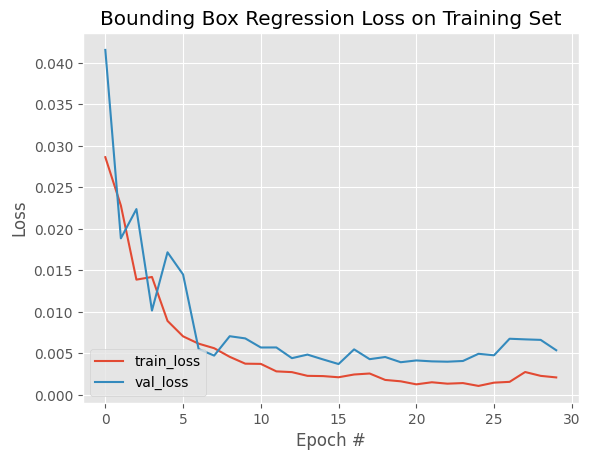

In [ ]:

# serialize the model to disk
print("[INFO] saving object detector model...")
model.save(MODEL_PATH, save_format="h5")
# plot the model training history
N = NUM_EPOCHS
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, N), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H.history["val_loss"], label="val_loss")
plt.title("Bounding Box Regression Loss on Training Set")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend(loc="lower left")
plt.savefig(PLOT_PATH)


In [ ]:

from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.models import load_model
import numpy as np
import mimetypes
import argparse
import imutils
import cv2
import os


In [ ]:
test_image = '/content/outputt/test_images.txt'

In [ ]:

ap = argparse.ArgumentParser()
ap.add_argument("-i", "--input", required=False,
	help="path to input image/text file of image filenames", default=test_image)
# args = vars(ap.parse_args())
args = ap.parse_args(args=[])
print(args.input)


/content/outputt/test_images.txt


In [ ]:
# determine the input file type, but assume that we're working with
# single input image
filetype = mimetypes.guess_type(args.input)[0]
print(filetype)
imagePaths = [args.input]
# if the file type is a text file, then we need to process *multiple*
# images
if "text/plain" == filetype:
	# load the filenames in our testing file and initialize our list
	# of image paths
	filenames = open(args.input).read().strip().split("\n")
	imagePaths = []
	# loop over the filenames
	for f in filenames:
		# construct the full path to the image filename and then
		# update our image paths list
		p = os.path.sep.join([IMAGES_PATH, f])
		imagePaths.append(p)
print(imagePaths)

text/plain
['/content/drive/MyDrive/pca_products_real/img_00015.jpg', '/content/drive/MyDrive/pca_products_real/img_00011.jpg', '/content/drive/MyDrive/pca_products_real/img_00004.jpg', '/content/drive/MyDrive/pca_products_real/img_00024.jpg']


In [ ]:

from google.colab.patches import cv2_imshow

[INFO] loading object detector...


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
450 600


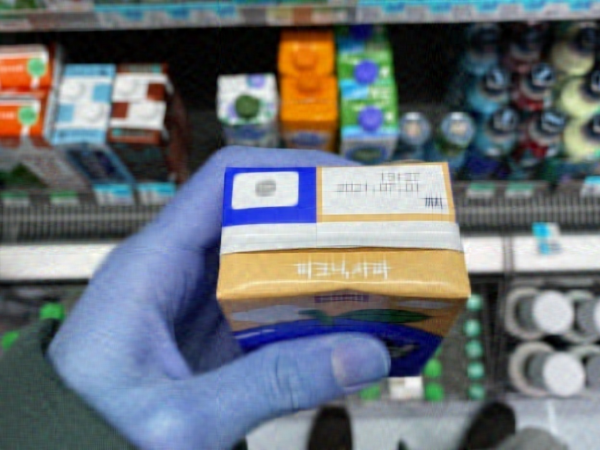

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step
450 600


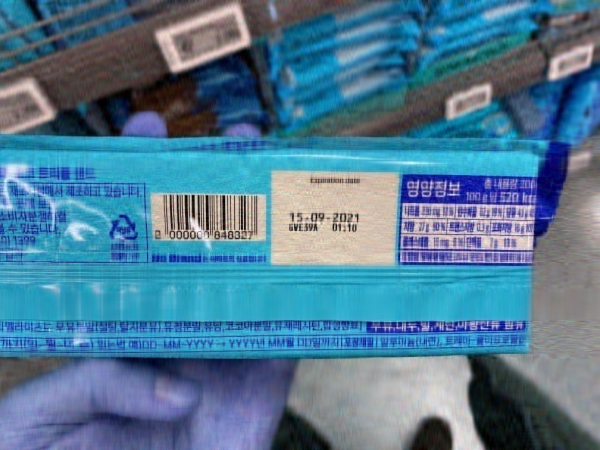

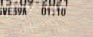

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step
449 600


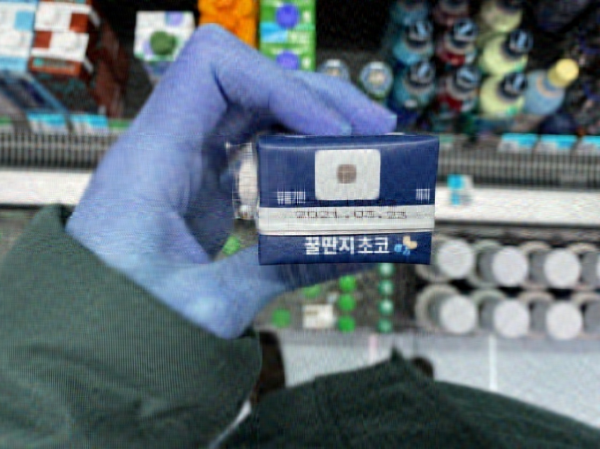

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step
450 600


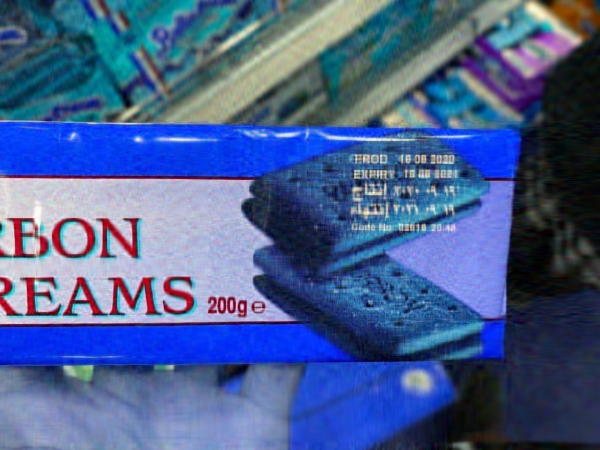

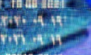

In [ ]:
from google.colab.patches import cv2_imshow

print("[INFO] loading object detector...")
model = load_model(MODEL_PATH)

# Loop over the images that we'll be testing using our bounding box regression model
for imagePath in imagePaths:
    # Load the input image (in Keras format) from disk and preprocess it
    image = cv2.imread(imagePath)
    (h, w) = image.shape[:2]
    image = cv2.resize(image, (224, 224))
    image = img_to_array(image) / 255.0
    image = np.expand_dims(image, axis=0)

    # Make bounding box predictions on the input image
    preds = model.predict(image)[0]
    (startX, startY, endX, endY) = preds

    # Load the input image (in OpenCV format), resize it for display, and grab its dimensions
    image = cv2.imread(imagePath)
    image = imutils.resize(image, width=600)
    (h, w) = image.shape[:2]
    print(h, w)

    # Scale the predicted bounding box coordinates based on the image dimensions
    startX = int(startX * w)
    startY = int(startY * h)
    endX = int(endX * w)
    endY = int(endY * h)

    # Show the output image
    cv2_imshow(image)

    # Extract and show the bounding box region
    bb = image[max(0, startY-10):min(h, endY+10), max(0, startX-10):min(w, endX+10)]
    cv2_imshow(bb)


In [ ]:

import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import os
import re
import numpy as np
import keras


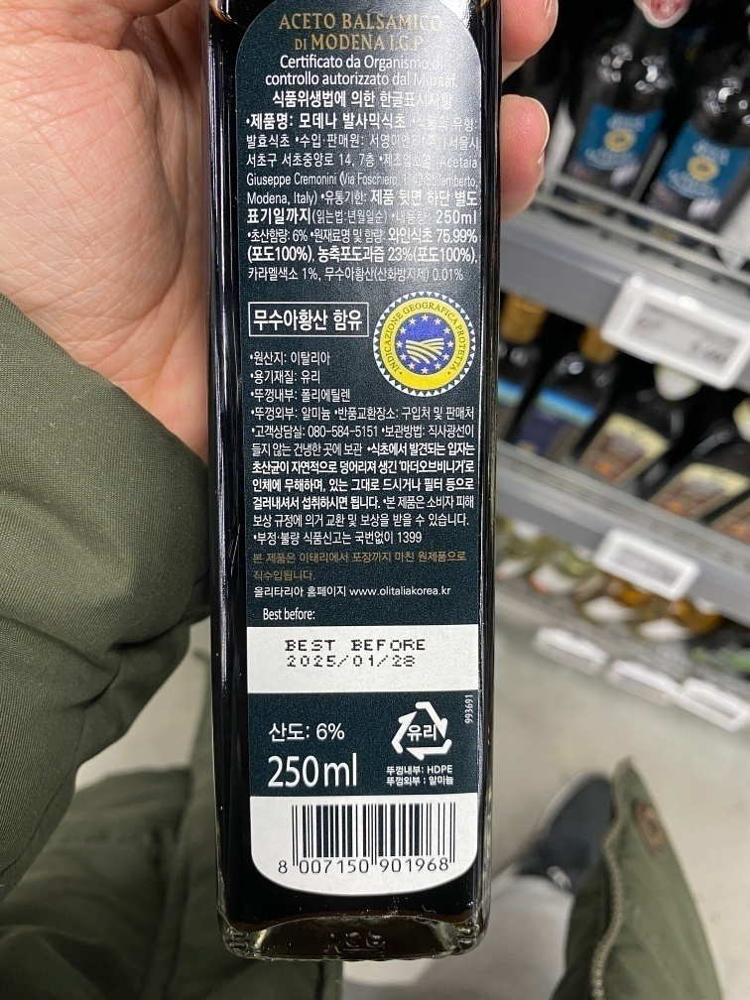

In [ ]:

img_path = '/content/img_00001.jpg'
img = cv2.imread(img_path)
cv2_imshow(img)

In [ ]:
annotation_path = '/content/annotations.json'

In [ ]:
import json

def show_image_with_bounding_box(image_path, annotation_path):
  img = cv2.imread(image_path)
  json_data = json.load(open(annotation_path))
  filename = image_path.split('/')[-1]
  data = json_data[filename]['ann']
  # plt.imshow(img)
  for a in data:
    bbox = a['bbox']
    cls = a['cls']
    x1 = int(bbox[0])
    y1 = int(bbox[1])
    x2 = int(bbox[2])
    y2 = int(bbox[3])
    if cls == 'date':
      cv2.rectangle(img,(x1,y1),(x2,y2),(255,0,0), 2)





  scale_percent = 220 # percent of original size
  width = int(img.shape[1] * scale_percent / 100)
  height = int(img.shape[0] * scale_percent / 100)
  dim = (width, height)

  resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
  plt.figure(figsize=(10, 10))
  plt.imshow(resized)

In [ ]:

ROOT = '/content/drive/MyDrive/images'
all_images = []
for path in os.listdir(ROOT):
  if os.path.isfile(os.path.join(ROOT, path)):
    all_images.append(os.path.join(ROOT, path))
print(all_images)

['/content/drive/MyDrive/images/img_01092.jpg', '/content/drive/MyDrive/images/img_00968.jpg', '/content/drive/MyDrive/images/img_00312.jpg', '/content/drive/MyDrive/images/img_00057.jpg', '/content/drive/MyDrive/images/img_00635.jpg', '/content/drive/MyDrive/images/img_00922.jpg', '/content/drive/MyDrive/images/img_00182.jpg', '/content/drive/MyDrive/images/img_00197.jpg', '/content/drive/MyDrive/images/img_00654.jpg', '/content/drive/MyDrive/images/img_00198.jpg', '/content/drive/MyDrive/images/img_00706.jpg', '/content/drive/MyDrive/images/img_00312 (1).jpg', '/content/drive/MyDrive/images/img_00635 (1).jpg', '/content/drive/MyDrive/images/img_00962.jpg', '/content/drive/MyDrive/images/img_01092 (1).jpg', '/content/drive/MyDrive/images/img_00441.jpg', '/content/drive/MyDrive/images/img_00009.jpg', '/content/drive/MyDrive/images/img_00412.jpg', '/content/drive/MyDrive/images/img_00722.jpg', '/content/drive/MyDrive/images/img_00913.jpg', '/content/drive/MyDrive/images/img_00968 (1).jp

KeyError: 'img_00312 (1).jpg'

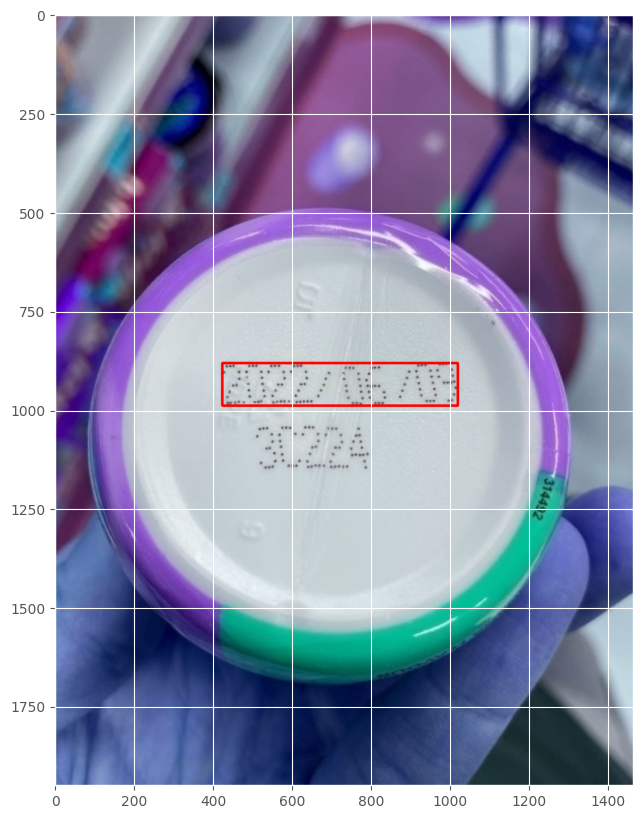

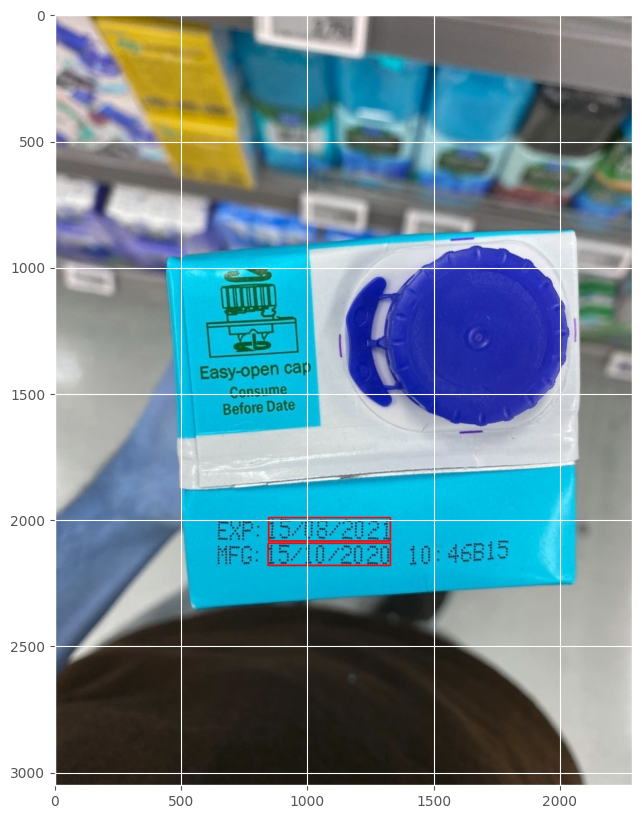

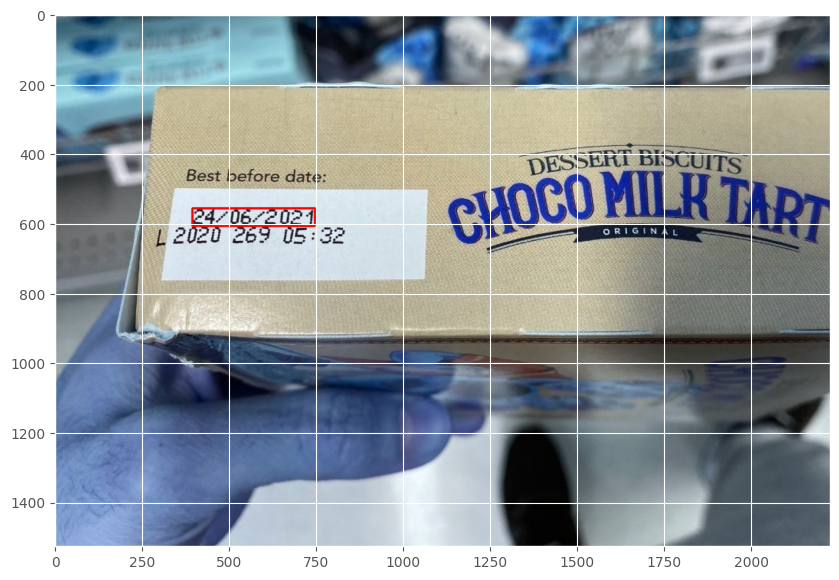

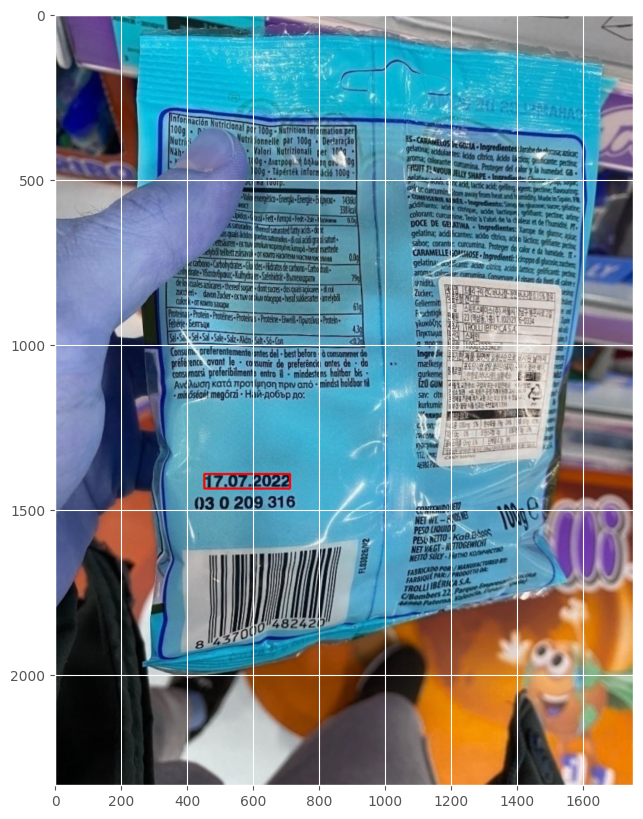

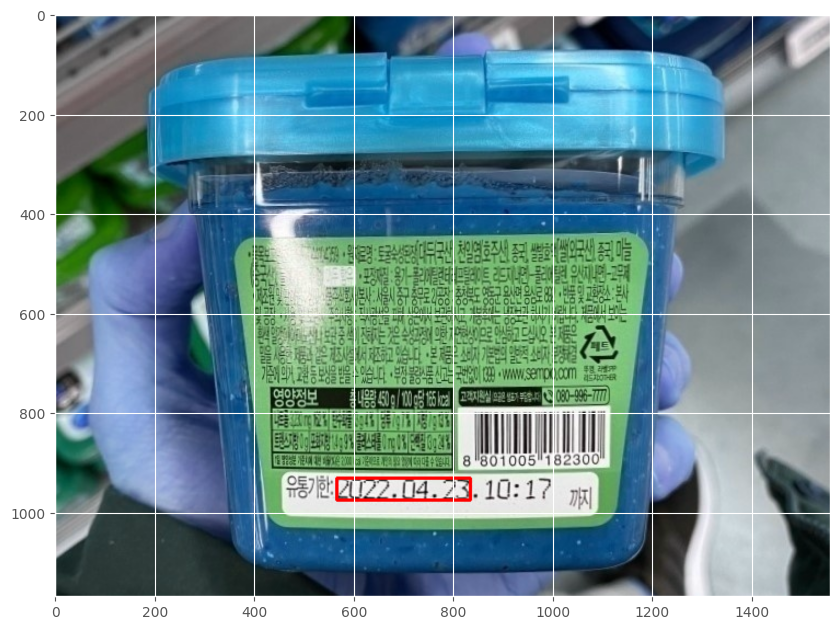

...

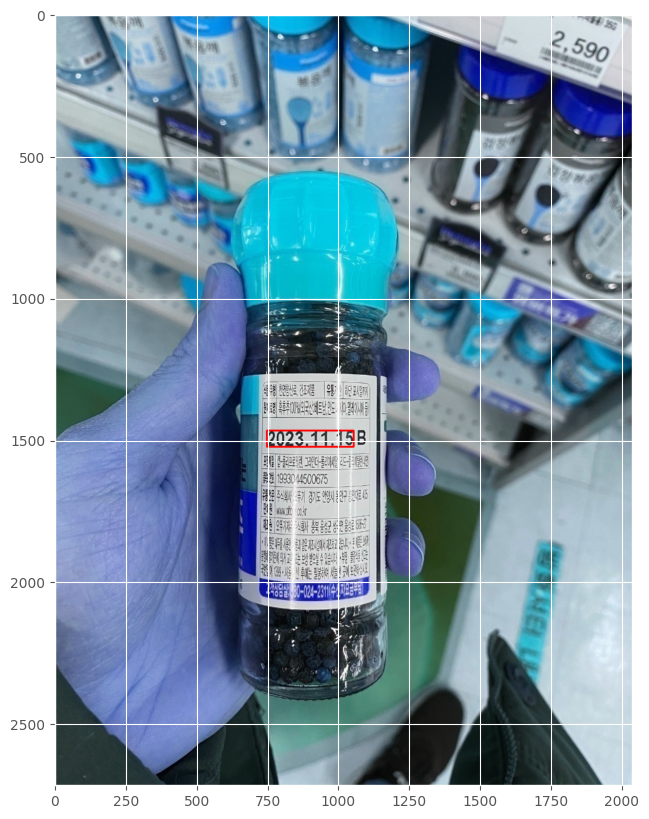

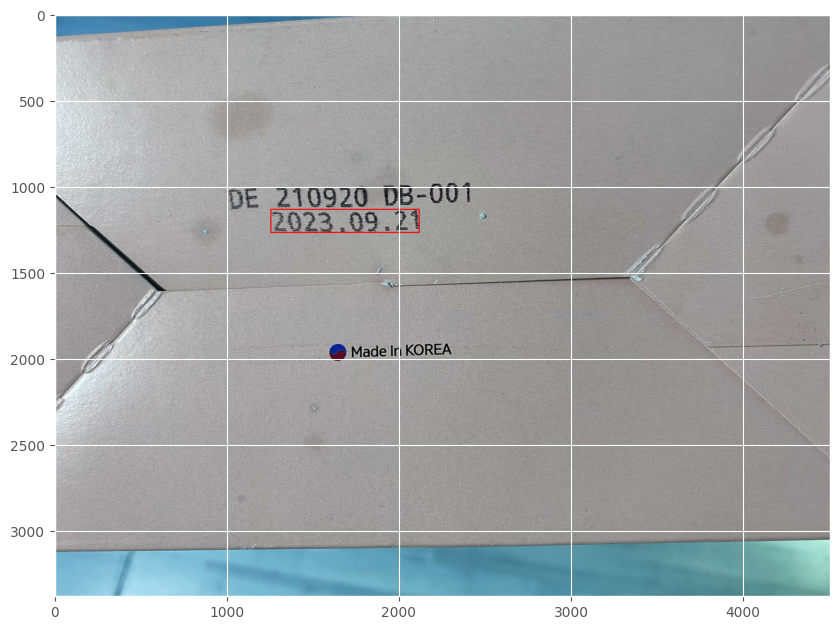

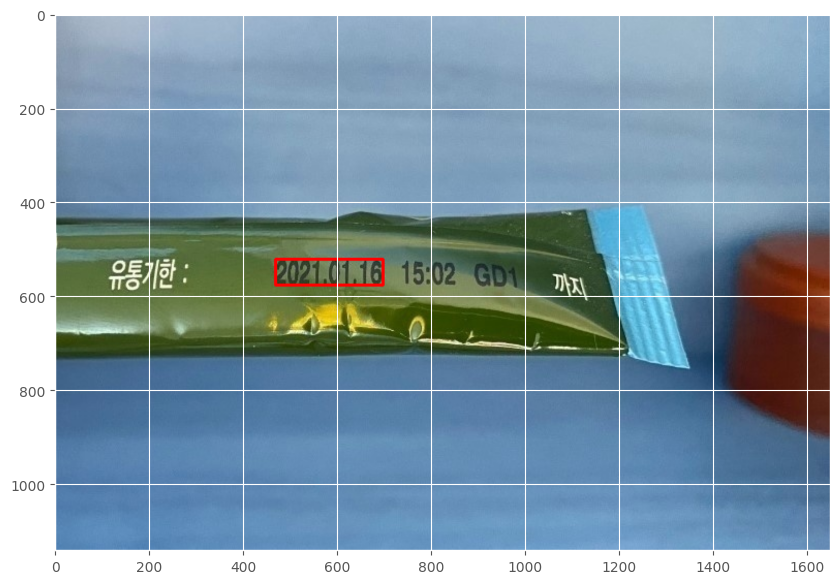

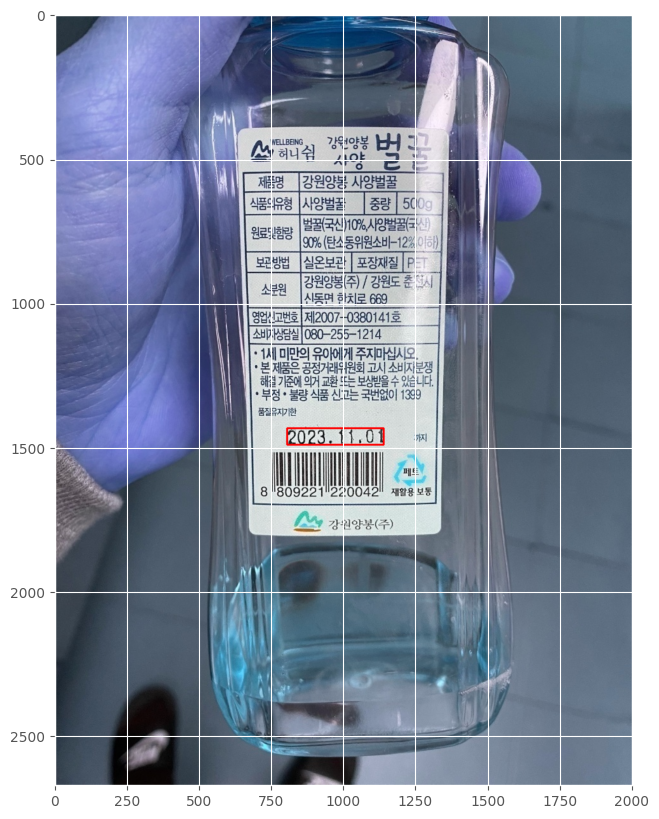

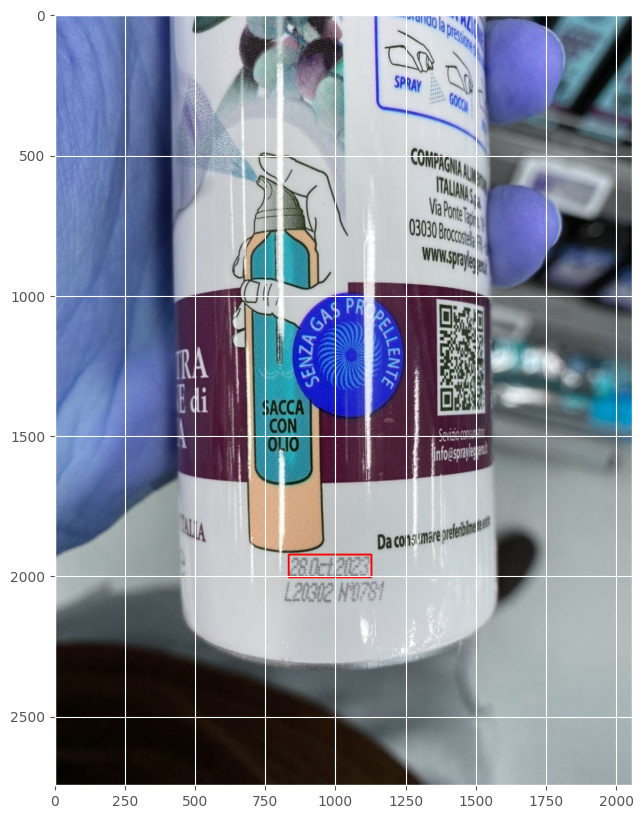

In [ ]:
for img_path in all_images:
  show_image_with_bounding_box(img_path, annotation_path)